In [55]:
library(tidyverse)
library(pheatmap)
library(ggfortify)
library(glmnet)
library(randomForest)

## General Introduction

* The data comes from digitized images of a Fine Needle Aspirate (FNA). In this procedure, a very thin needle is inserted into the breast mass to draw out a sample of individual cells. Pathologists then analyze the images of these cells. [1]

<br>
<br>
<div align="center">
<img src="https://my.clevelandclinic.org/-/scassets/images/org/health/articles/17872-fine-needle-aspiration-fna" style="height:350px;" />
<br>
<i>Fine Needle Aspirate (FNA) [2]</i>
</div>
<br>
<br>

* The measurements like `radius_mean`, `texture_mean`, `concavity_worst`, etc., are all calculated from the nuclei found within those sampled cells.

* The dataset is based on the idea that cancerous cells exhibit visible changes in their nuclei, such as being larger, more irregularly shaped, and having different textures.

<br>

References: 

[1] Street, William Nick et al. “Nuclear feature extraction for breast tumor diagnosis.” Electronic imaging (1993).

[2] https://www.enthealth.org/conditions/fine-needle-aspiration/

## Features Introduction

* `diagnosis`: This is the target variable to predict. 'M' for Malignant and 'B' for Benign.

* `radius`: The mean of distances from the center to points on the perimeter of the nucleus.

* `texture`: The standard deviation of gray-scale values in the image of the nucleus. It measures the variation in pixel intensity, giving an idea of the surface texture.

* `perimeter`: The length of the boundary of the cell nucleus.

* `area`: The area of the cell nucleus.

* `smoothness`: A measure of the local variation in radius lengths. A smoother, more regular nucleus will have a lower smoothness value.

* `compactness`: A measure of the shape's compactness. It is calculated using the formula:
    $$
    \frac{\text{perimeter}^2}{\text{area}} - 1.0
    $$
    A perfect circle has a compactness value of 0. Higher values indicate a more irregular and less compact shape.

* `concavity`: The severity of concave portions (indentations) of the nucleus's contour.

* `concave points`: The number of concave portions of the contour. This is related to concavity but focuses on the count of indentations.

* `symmetry`: Measures the symmetry of the nucleus. A perfectly symmetrical nucleus would have a higher value.

* `fractal_dimension`: A measure of the complexity and irregularity of the nucleus's boundary. A more complex, "coastline-like" boundary will have a higher fractal dimension.

## Suffixes Explained

There are three main statistical measures calculated for each feature, which are represented by the suffixes:

* `_mean`: The average value for that feature across all cell nuclei in a given image. For example, `radius_mean` is the average radius of all the cell nuclei in one sample image.

* `_worst`: The mean of the three largest values of that feature in the image. For example, `concavity_worst` is the average of the three most severe concave portions found among the cell nuclei. This metric is used to capture the most extreme or abnormal characteristics.

* `_se`: The standard error of the mean for that feature. This measures the variability or uncertainty in the mean value. A smaller standard error indicates that the mean is a more accurate representation of the true average.

## Background Knowledge: Heterogeneity

> **Definition: Cancer heterogeneity describes the differences among cancer cells within the same tumor (intratumoral) or between different tumors (intertumoral).**

<br>
<br>
<div align="center">
<img src="https://www.mdpi.com/cancers/cancers-13-06352/article_deploy/html/images/cancers-13-06352-g001.png" style="height:350px;" />
<br>
<i>Inter-tumour Heterogeneity and Intra-tumour Heterogeneity [3]</i>
</div>
<br>
<br>

* **The dataset we choose collects the data of `Intratumoural Characteristics`.**

* In this dataset, **`Intratumoural Heterogeneity`** can be directly quantified by `_se` features.

<br>
References:

[3] https://doi.org/10.3390/cancers13246352

## Data Loading and Cleaning

In [56]:
fig <- function(x ,y){
    options(repr.plot.width = x, repr.plot.height = y)
}

In [57]:
breast_cancer <- read.csv('Cancer_Data.csv')

In [58]:
head(breast_cancer)

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave.points_mean,⋯,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave.points_worst,symmetry_worst,fractal_dimension_worst,X
,<int>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<lgl>
1,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,⋯,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890,NA
2,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,⋯,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902,NA
3,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,⋯,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758,NA
4,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,⋯,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300,NA
5,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,⋯,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678,NA
6,843786,M,12.45,15.70,82.57,477.1,0.12780,0.17000,0.1578,0.08089,⋯,23.75,103.40,741.6,0.1791,0.5249,0.5355,0.1741,0.3985,0.12440,NA


In [59]:
dim(breast_cancer)

[1] 569  33

There are 33 features in the dataset, with 569 observations.

Check if there are any missing values:

In [60]:
anyNA(breast_cancer)

[1] TRUE

In [61]:
nrow(breast_cancer[rowSums(is.na(breast_cancer) > 0), ])

[1] 569

In [62]:
colSums(is.na(breast_cancer))

id               diagnosis             radius_mean 
                      0                       0                       0 
           texture_mean          perimeter_mean               area_mean 
                      0                       0                       0 
        smoothness_mean        compactness_mean          concavity_mean 
                      0                       0                       0 
    concave.points_mean           symmetry_mean  fractal_dimension_mean 
                      0                       0                       0 
              radius_se              texture_se            perimeter_se 
                      0                       0                       0 
                area_se           smoothness_se          compactness_se 
                      0                       0                       0 
           concavity_se       concave.points_se             symmetry_se 
                      0                       0                       0 
   fractal_dimension_se            radius_worst           texture_worst 
                      0                       0                       0 
        perimeter_worst              area_worst        smoothness_worst 
                      0                       0                       0 
      compactness_worst         concavity_worst    concave.points_worst 
                      0                       0                       0 
         symmetry_worst fractal_dimension_worst                       X 
                      0                       0                     569

We notice that the missing values is from the last column, so we just drop the last column

In [63]:
breast_cancer <- breast_cancer[, -33]

And drop the column `id`, which is irrelevant to the coming data analysis.

In [64]:
breast_cancer <- breast_cancer[, -1]

Recheck the dataset, ensuring we are doing the right thing.

In [65]:
dim(breast_cancer)

[1] 569  31

In [66]:
anyNA(breast_cancer)

[1] FALSE

In [67]:
names(breast_cancer)

[1] "diagnosis"               "radius_mean"            
 [3] "texture_mean"            "perimeter_mean"         
 [5] "area_mean"               "smoothness_mean"        
 [7] "compactness_mean"        "concavity_mean"         
 [9] "concave.points_mean"     "symmetry_mean"          
[11] "fractal_dimension_mean"  "radius_se"              
[13] "texture_se"              "perimeter_se"           
[15] "area_se"                 "smoothness_se"          
[17] "compactness_se"          "concavity_se"           
[19] "concave.points_se"       "symmetry_se"            
[21] "fractal_dimension_se"    "radius_worst"           
[23] "texture_worst"           "perimeter_worst"        
[25] "area_worst"              "smoothness_worst"       
[27] "compactness_worst"       "concavity_worst"        
[29] "concave.points_worst"    "symmetry_worst"         
[31] "fractal_dimension_worst"

## Exploratory Data Analysis

### 1. Check outliers with Boxplots

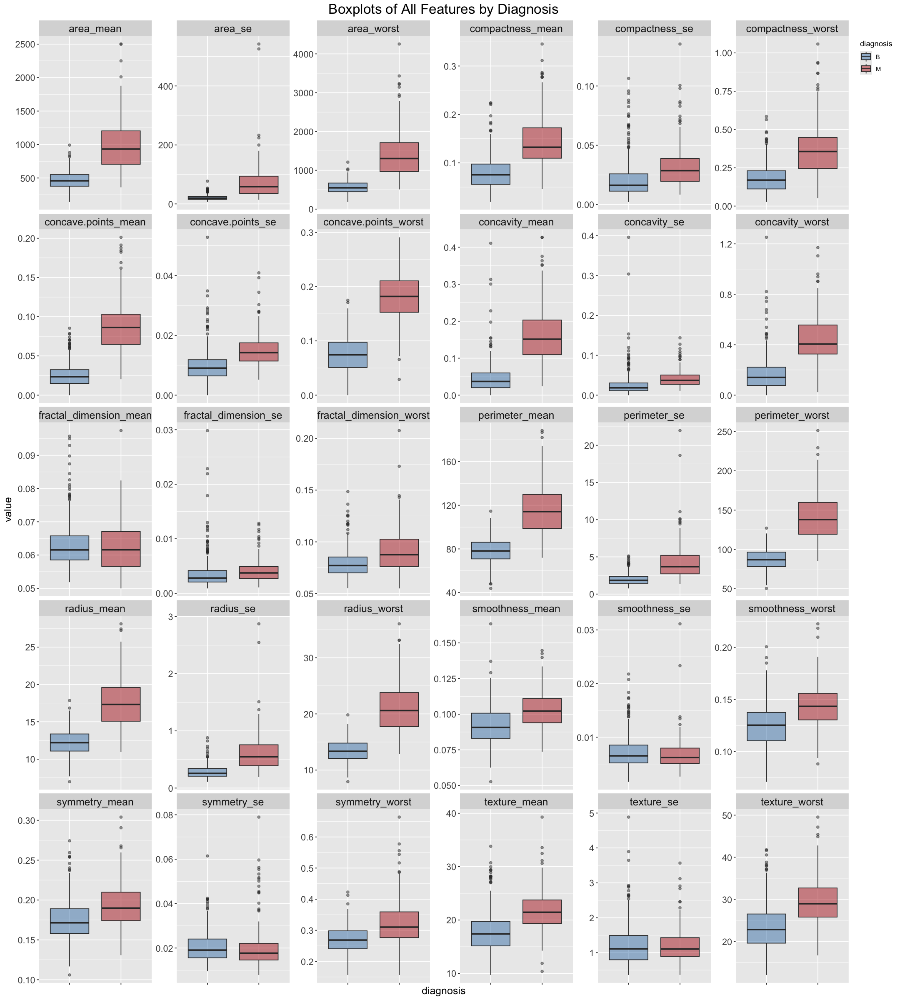

In [68]:
fig(18, 20)
long_data <- breast_cancer %>%
  pivot_longer(-diagnosis, names_to = "feature", values_to = "value")

ggplot(long_data, aes(x = diagnosis, y = value, fill = diagnosis)) +
  geom_boxplot(alpha = 0.5) +
  facet_wrap(~ feature, scales = "free_y") +
  theme(axis.text.x = element_blank()) +
  labs(title = "Boxplots of All Features by Diagnosis") +
  scale_fill_manual(values = c("B" = "steelblue", "M" = "firebrick")) +
  theme(
        plot.title = element_text(hjust = 0.5, size = 20),
        axis.title = element_text(size = 15),
        axis.text = element_text(size = 13),
        strip.text = element_text(size = 15), 
        legend.justification = c("right", "top")
        )

**Insights:**

* Malignant tumors consistently have larger values for these features (e.g., larger radius, larger area, more concave points, worse texture) than benign tumors.

* These outliers should not be removed. They are the most informative points for models to identify the most dangerous cases.

### 2. Heatmaps

* **Red (close to 1):** Strong positive correlation. When one variable increases, the other tends to increase as well.

* **Blue (close to -1):** Strong negative correlation. When one variable increases, the other tends to decrease.

* **Light Colors (close to 0):** Weak or no linear correlation. The variables don't have a clear linear relationship.

* **Clustering:**  The algorithm will group features that are close to each other on a branch have similar correlation patterns with all other features

> **Question:** What does the correlation heatmap reveal about multicollinearity, and how should this discovery guide our model selection?

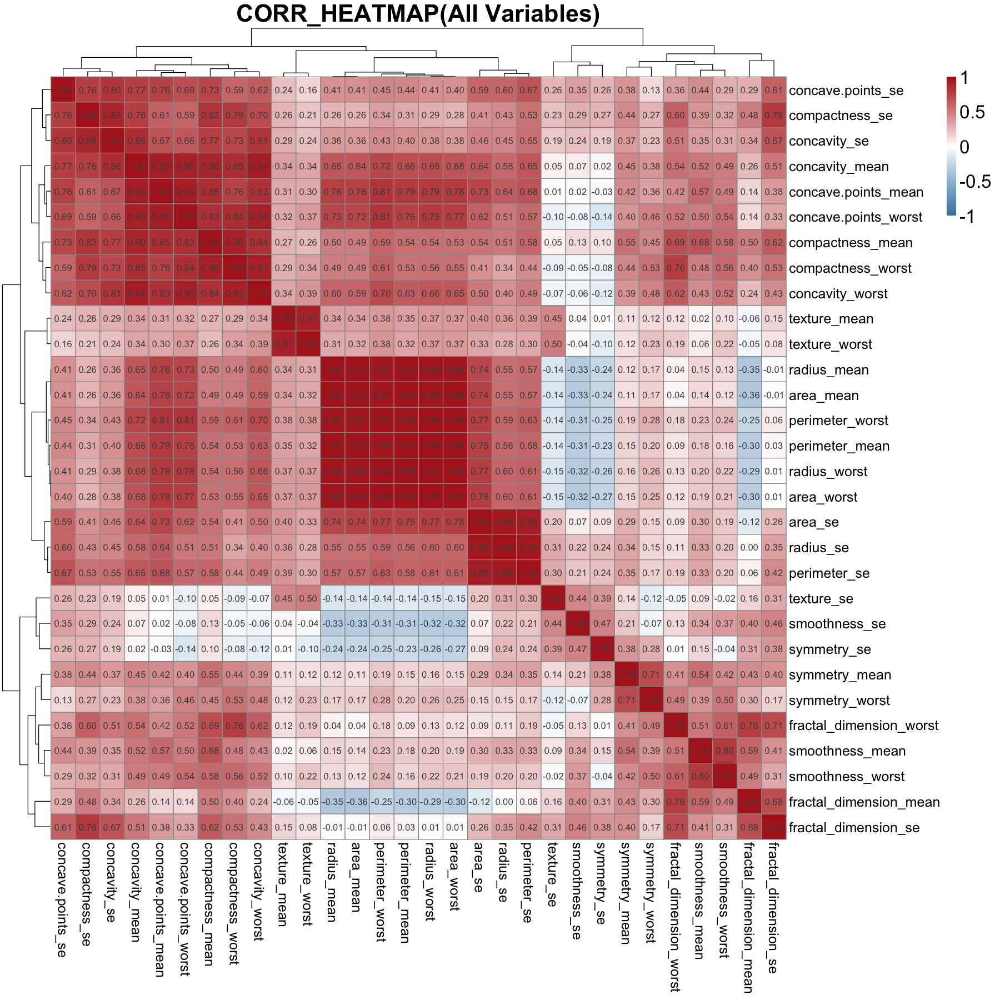

In [69]:
fig(15, 15)
breast_cancer_corr_matrix <- cor(breast_cancer |> select(where(is.numeric)), use = "pairwise.complete.obs", method = 'spearman')
pheatmap(breast_cancer_corr_matrix, 
        display_numbers = TRUE, 
        main = "CORR_HEATMAP(All Variables)", 
        fontsize_col = 15, fontsize_row = 15, fontsize = 20, fontsize_number = 10,
        breaks = seq(-1, 1, by = 0.02),
        color = colorRampPalette(c("steelblue", "white", "firebrick"))(100)
        )


**Insights:**

* This heat map shows the dataset has extremely high multicollinearity, which is harmful to the performance of some models like logistic regression. 

* So in the following model construction, for the sake of accurate and stable prediction, we should choose some powerful algorithms to reduce the effects of multicollinearity, like XGBoost.

> **Question:** What key patterns and feature relationships can be identified from a detailed analysis of the correlation heatmap?

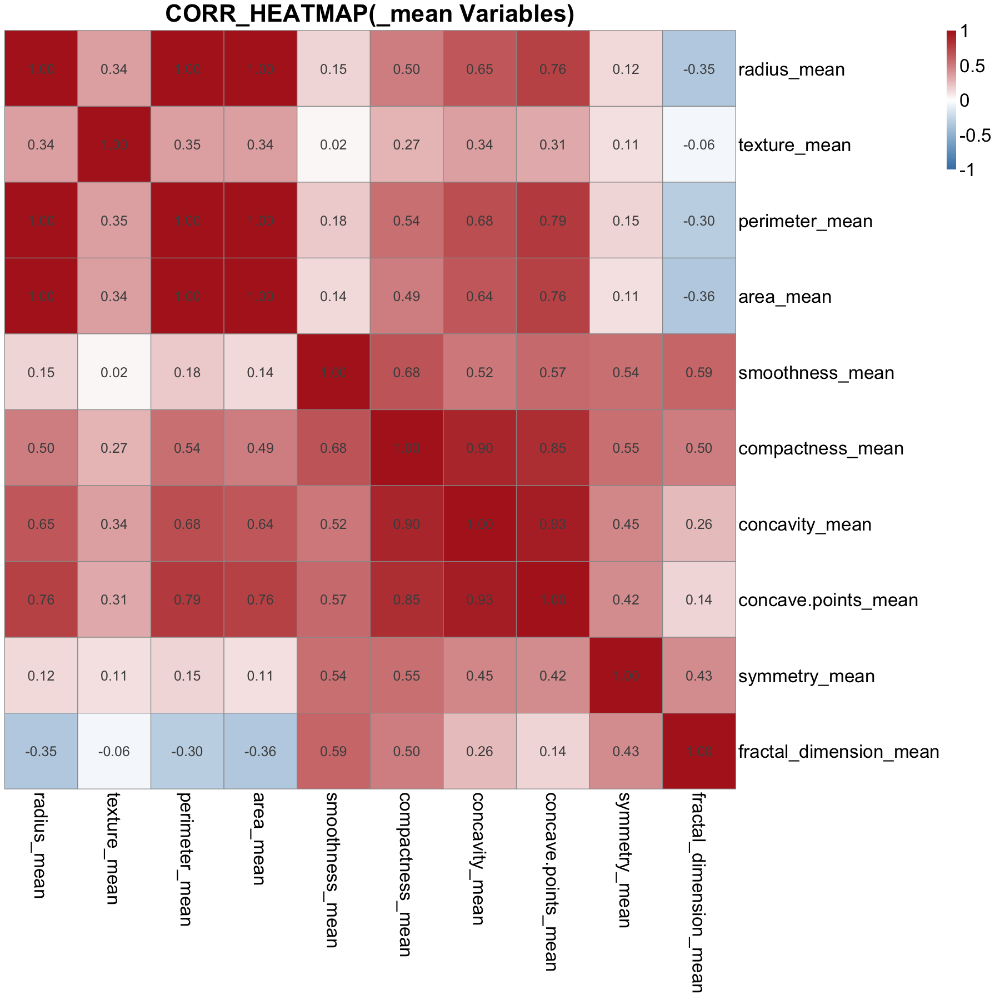

In [70]:
breast_cancer_mean_corr_matrix <- cor(breast_cancer |> select(where(is.numeric) & ends_with("_mean")), use = "pairwise.complete.obs", method = 'spearman')
pheatmap(
    breast_cancer_mean_corr_matrix, 
    display_numbers = TRUE, 
    main = "CORR_HEATMAP(_mean Variables)", 
    fontsize_number = 15, fontsize_col = 20, fontsize_row = 20, fontsize = 20, 
    cluster_rows = F, cluster_cols = F,
    breaks = seq(-1, 1, by = 0.02),
    color = colorRampPalette(c("steelblue", "white", "firebrick"))(100)
    )


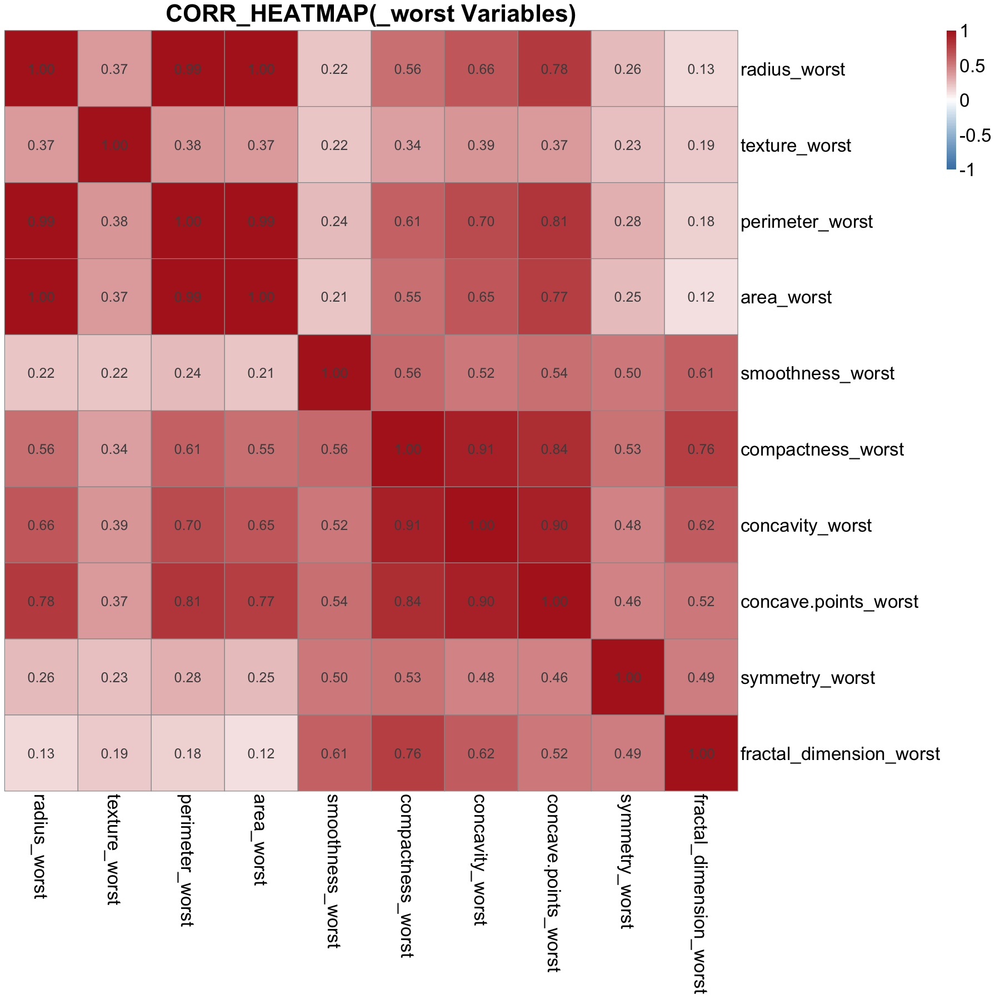

In [71]:
breast_cancer_mean_corr_matrix <- cor(breast_cancer |> select(where(is.numeric) & ends_with("_worst")), use = "pairwise.complete.obs", method = 'spearman')
pheatmap(
    breast_cancer_mean_corr_matrix, 
    display_numbers = TRUE, 
    main = "CORR_HEATMAP(_worst Variables)", 
    fontsize_number = 15, fontsize_col = 20, fontsize_row = 20, fontsize = 20, 
    cluster_rows = F, cluster_cols = F,
    breaks = seq(-1, 1, by = 0.02),
    color = colorRampPalette(c("steelblue", "white", "firebrick"))(100)
    )


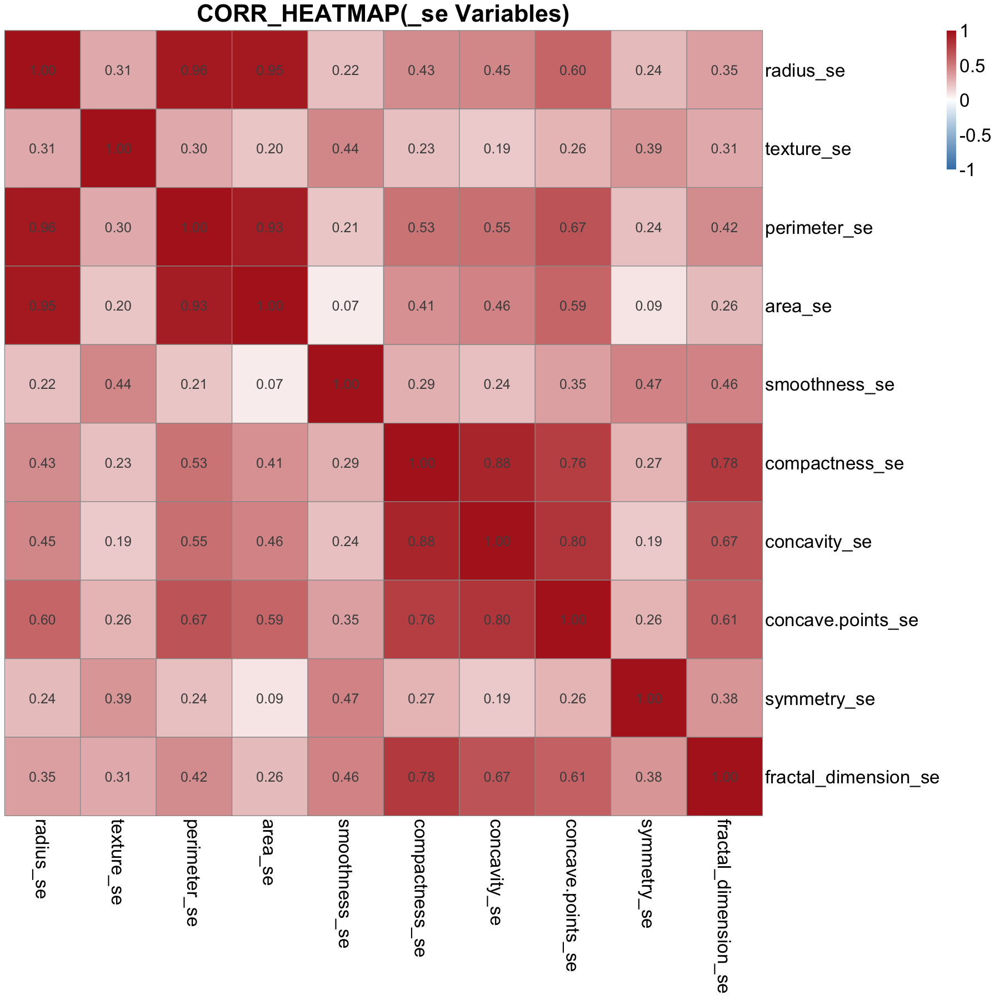

In [72]:
breast_cancer_mean_corr_matrix <- cor(breast_cancer |> select(where(is.numeric) & ends_with("_se")), use = "pairwise.complete.obs", method = 'spearman')
pheatmap(
    breast_cancer_mean_corr_matrix, 
    display_numbers = TRUE, 
    main = "CORR_HEATMAP(_se Variables)", 
    fontsize_number = 15, fontsize_col = 20, fontsize_row = 20, fontsize = 20, 
    cluster_rows = F, cluster_cols = F,
    breaks = seq(-1, 1, by = 0.02),
    color = colorRampPalette(c("steelblue", "white", "firebrick"))(100)
    )


**Insights:**

* **Strong Multicollinearity in Size-Related Features:** The dark red squares in `_mean`, `_worst` and `_se` plot, show the extremely high correlation between(often > 0.95): `radius_`, `perimeter_` and `area_`. And it means a nucleus with a larger radius will naturally have a larger perimeter and a larger area.

* **Strong Multicollinearity in Shape-Related Features:** Also, the `compactness_`, `concavity_` and `concave.points_` are highly correleated. It tells that a nucleus is less compact is likely to have more and deeper indentations. And these collectively describe the complexity and irregularity of the nucleus' shape.

* **The `_worst` features amplify the relationships:** The overall structure of `_mean` heatmap is quite similar to that of `_worst` heatmap, however, the correlations in `_worst` group is stronger.

* The `texture`, `smoothness`, `fractal_dimension` and `symmetry` are generally less correlated with the size and shape features. It seems that these features provide different kinds of information.

### 3. Malignant versus Benign

> **Question:** How do the feature distributions differ between the malignant and benign classes, and which features appear to be the strongest or weakest predictors based on this analysis?

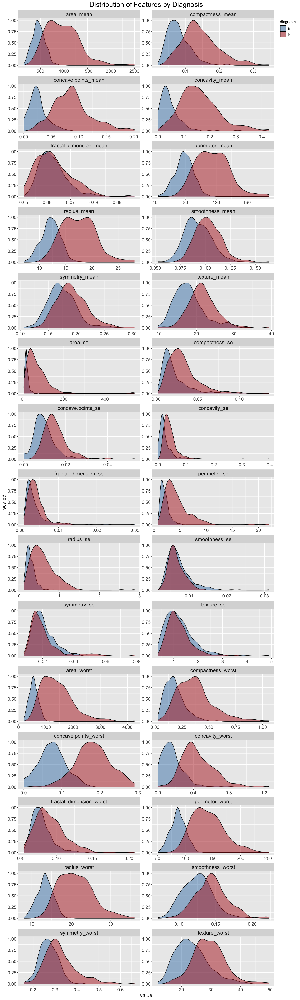

In [73]:
fig(12,40)
breast_cancer |>
    pivot_longer(cols = -diagnosis, names_to = "feature", values_to = "value") |>
    mutate(suffix = str_extract(feature, "(mean|se|worst)$")) |>
    arrange(suffix, feature) |>
    mutate(feature = fct_inorder(feature)) |>
    ggplot(aes(x = value, fill = diagnosis)) +
    geom_density(aes(y = after_stat(scaled)), alpha = 0.5) +
    facet_wrap(~feature, scales = "free", ncol = 2) +
    labs(title = "Distribution of Features by Diagnosis") +
    scale_fill_manual(values = c("B" = "steelblue", "M" = "firebrick"))+
    theme(
        plot.title = element_text(hjust = 0.5, size = 20),
        axis.title = element_text(size = 15),
        axis.text = element_text(size = 13),
        strip.text = element_text(size = 15), 
        legend.justification = c("right", "top")
        )

**Insights:**

* For the `Size-Related` features (`radius_`, `perimeter_` and `area_`) and `Shape-Related` features (`compactness_`, `concavity_` and `concave.points_`), the red curves (Malignant) are generally shifted to the right. **It indicateds that the malignant tumours have generally larger size and more irregular shape than the benign ones.**

* For the `_se` features, the red curves spread wider and shift to the right for most of the features, **indicating the malignant tumours exhibit more intra-tumour heterogeneity.** 

* There are some potential weak predictors, like `fractal_dimension_mean`, `smoothness_se`, `texture_se`, `symmetry_se`. Since the red and blue curves for these features overlap a great deal, and it means both malignant and benign tumours can have very similar values.

> **Question:** How effective is `fractal_dimension_mean` at separating the two classes?

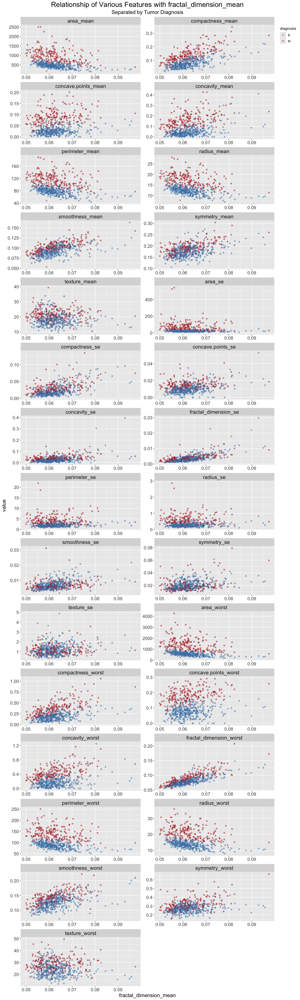

In [74]:
fig(12,40)
breast_cancer |>
    pivot_longer(cols = -c(diagnosis, fractal_dimension_mean), names_to = "feature", values_to = "value") |>
    mutate(suffix = str_extract(feature, "(mean|se|worst)$")) |>
    arrange(suffix, feature) |>
    mutate(feature = fct_inorder(feature)) |>
    ggplot(aes(x = fractal_dimension_mean, y = value, color = diagnosis)) +
    geom_point(alpha = 0.5) +
    facet_wrap(~feature, scales = "free", ncol = 2) +
    labs(title = "Relationship of Various Features with fractal_dimension_mean", subtitle = "Separated by Tumor Diagnosis") +
    scale_color_manual(values = c("B" = "steelblue", "M" = "firebrick"))+
    theme(
        plot.title = element_text(hjust = 0.5, size = 20),
        plot.subtitle = element_text(hjust = 0.5, size = 15), 
        axis.title = element_text(size = 15),
        axis.text = element_text(size = 13),
        strip.text = element_text(size = 15), 
        legend.justification = c("right", "top")
        )

**Insights:**

* From this set of scatterplots, `fractal_dimension_mean` has a weak correlation with most of the other features, suggesting it measures a relatively independent characteristic of cell nuclei. 

* However, both benign and malignant tumours share a similar range of values for `fractal_dimension_mean`, indicating that it is not very useful for distinguishing between malignant and benign cases.

> **Question:** Which feature stands out as the single most powerful predictor?

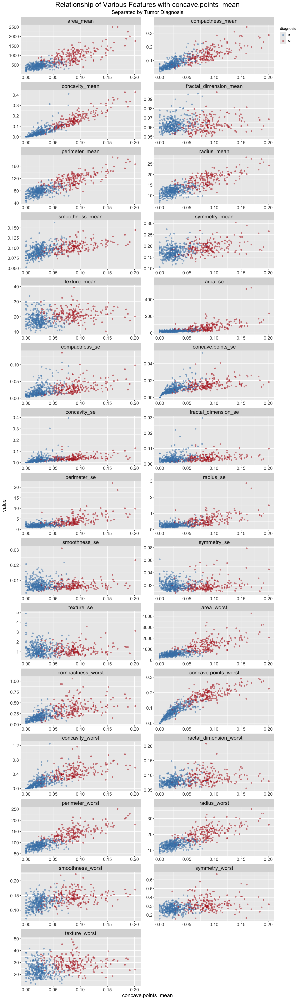

In [75]:
fig(12,40)
breast_cancer |>
    pivot_longer(cols = -c(diagnosis, concave.points_mean), names_to = "feature", values_to = "value") |>
    mutate(suffix = str_extract(feature, "(mean|se|worst)$")) |>
    arrange(suffix, feature) |>
    mutate(feature = fct_inorder(feature)) |>
    ggplot(aes(x = concave.points_mean, y = value, color = diagnosis)) +
    geom_point(alpha = 0.5) +
    facet_wrap(~feature, scales = "free", ncol = 2) +
    labs(title = "Relationship of Various Features with concave.points_mean", subtitle = "Separated by Tumor Diagnosis") +
    scale_color_manual(values = c("B" = "steelblue", "M" = "firebrick"))+
    theme(
        plot.title = element_text(hjust = 0.5, size = 20),
        plot.subtitle = element_text(hjust = 0.5, size = 15), 
        axis.title = element_text(size = 15),
        axis.text = element_text(size = 13),
        strip.text = element_text(size = 15), 
        legend.justification = c("right", "top")
        )

**Insights:**

* This visualisation confirms that `concave points_mean` is an important feature for diagnosing malignancy in this dataset. Because it shows the clearest and most effective separation between malignant and benign. And it has strong positive correlation with most of the features.

### 4. PCA and visualisation

In [76]:
pca_data <- breast_cancer |>
    select(where(is.numeric))

pca_result <- prcomp(pca_data, center = TRUE, scale. = TRUE)

summary(pca_result)

Importance of components:
                          PC1    PC2     PC3     PC4     PC5     PC6     PC7
Standard deviation     3.6444 2.3857 1.67867 1.40735 1.28403 1.09880 0.82172
Proportion of Variance 0.4427 0.1897 0.09393 0.06602 0.05496 0.04025 0.02251
Cumulative Proportion  0.4427 0.6324 0.72636 0.79239 0.84734 0.88759 0.91010
                           PC8    PC9    PC10   PC11    PC12    PC13    PC14
Standard deviation     0.69037 0.6457 0.59219 0.5421 0.51104 0.49128 0.39624
Proportion of Variance 0.01589 0.0139 0.01169 0.0098 0.00871 0.00805 0.00523
Cumulative Proportion  0.92598 0.9399 0.95157 0.9614 0.97007 0.97812 0.98335
                          PC15    PC16    PC17    PC18    PC19    PC20   PC21
Standard deviation     0.30681 0.28260 0.24372 0.22939 0.22244 0.17652 0.1731
Proportion of Variance 0.00314 0.00266 0.00198 0.00175 0.00165 0.00104 0.0010
Cumulative Proportion  0.98649 0.98915 0.99113 0.99288 0.99453 0.99557 0.9966
                          PC22    PC23   PC24 

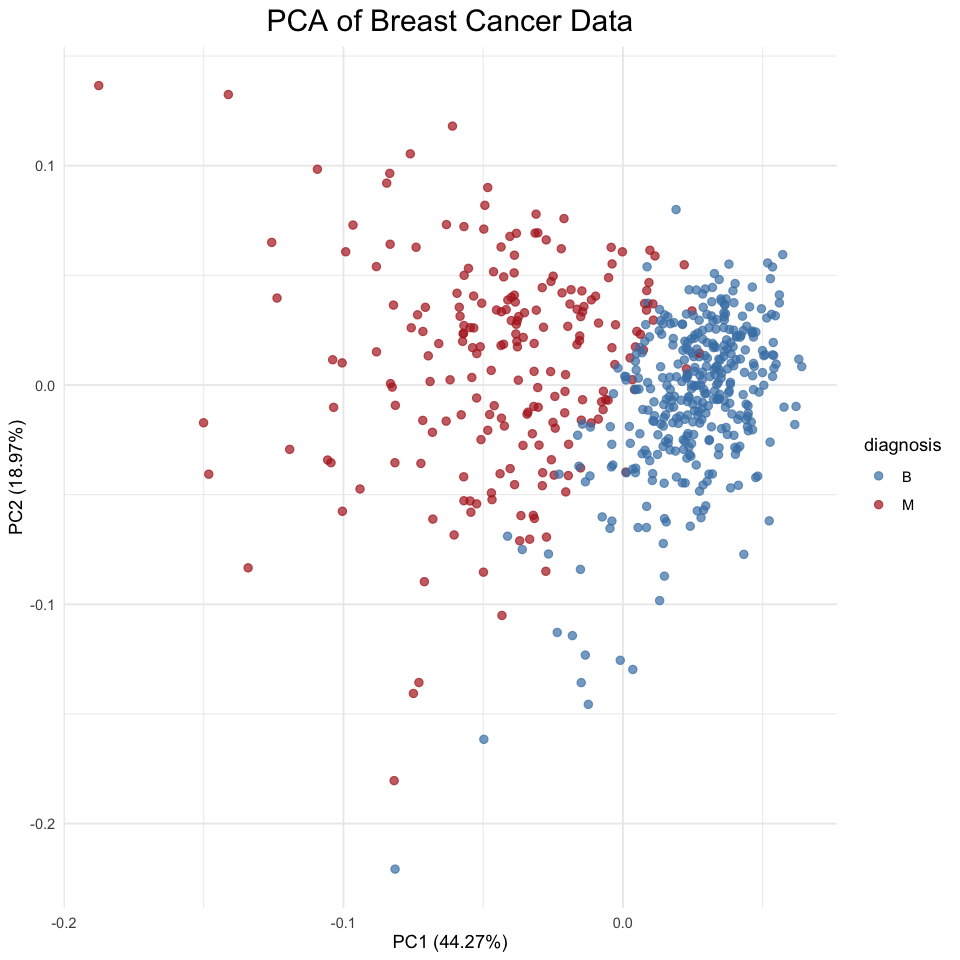

In [77]:
fig(8, 8)
autoplot(
    pca_result,
    data = breast_cancer,
    colour = 'diagnosis',
    main = 'PCA of Breast Cancer Data',
    size = 2,
    alpha = 0.7
) +
scale_color_manual(values = c("B" = "steelblue", "M" = "firebrick")) +
theme_minimal() +
theme(plot.title = element_text(hjust = 0.5, size = 18))

**Insights:**

* This PCA plot provides a powerful evidence that the data is highly separable, indicating that a machine learning model should be able to distinguish between malignant and benign tumours with high accuracy.

### 4. Feature Selection

* With Lasso Regression (L1 regularization)

In [78]:
x <- model.matrix(diagnosis ~., data = breast_cancer)[, -1]
y <- breast_cancer$diagnosis
grid <- 10^seq(0, -3, length = 1000)

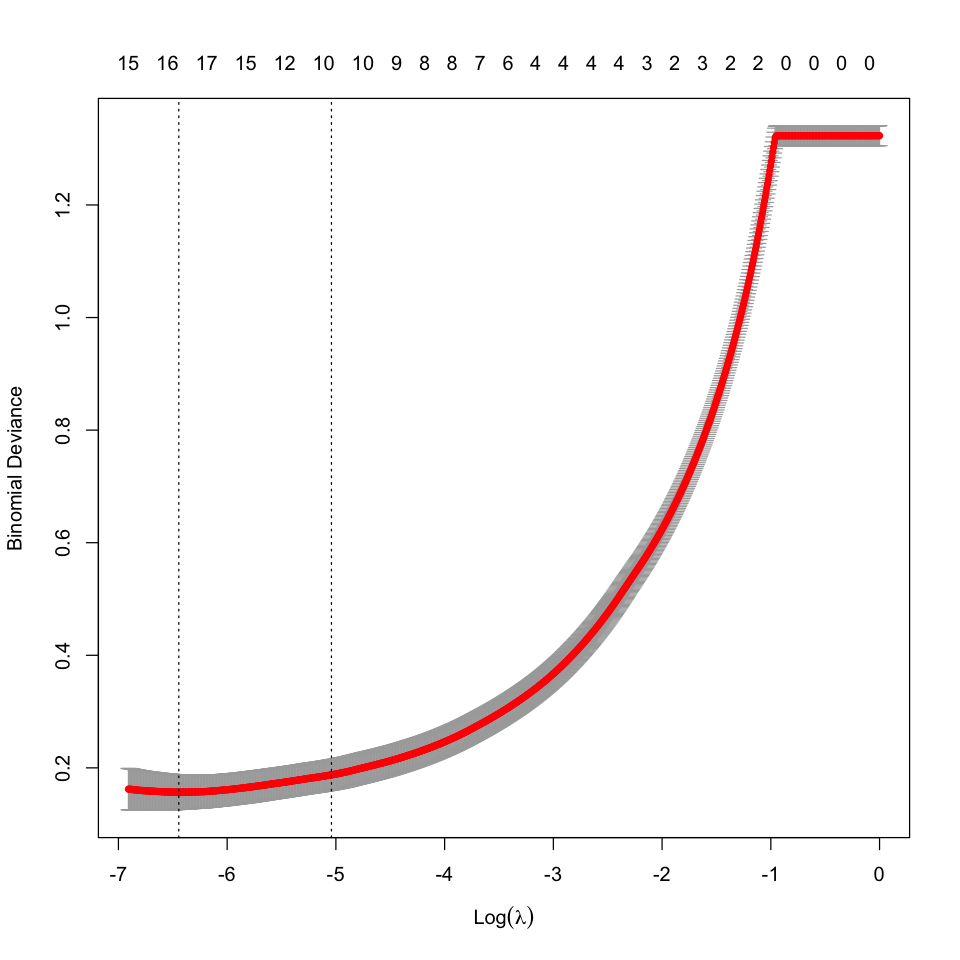

In [79]:
set.seed(42)
lasso_fit <- cv.glmnet(x, y, family = 'binomial', alpha = 1, lambda = grid)
plot(lasso_fit)

In [83]:
best_lambda <- lasso_fit$lambda.1se
lasso_coefs <- coef(lasso_fit, s = best_lambda)
lasso_coefs

31 x 1 sparse Matrix of class "dgCMatrix"
                                 s1
(Intercept)             -24.7333568
radius_mean               .        
texture_mean              0.0296620
perimeter_mean            .        
area_mean                 .        
smoothness_mean           .        
compactness_mean          .        
concavity_mean            .        
concave.points_mean      13.8996654
symmetry_mean             .        
fractal_dimension_mean    .        
radius_se                 4.4984766
texture_se                .        
perimeter_se              .        
area_se                   .        
smoothness_se             .        
compactness_se            .        
concavity_se              .        
concave.points_se         .        
symmetry_se               .        
fractal_dimension_se    -73.6642545
radius_worst              0.6639291
texture_worst             0.1601057
perimeter_worst           .        
area_worst                .        
smoothness_worst      

**Insights:**

* By the result of Lasso Regression, `concave.points_worst` (16.48) has the strongest influence on the prediction. 

* `Smoothness_worst` (15.60) and `concave.points_mean` (12.22) have strong influences on the prediction too.

* With Random Forest

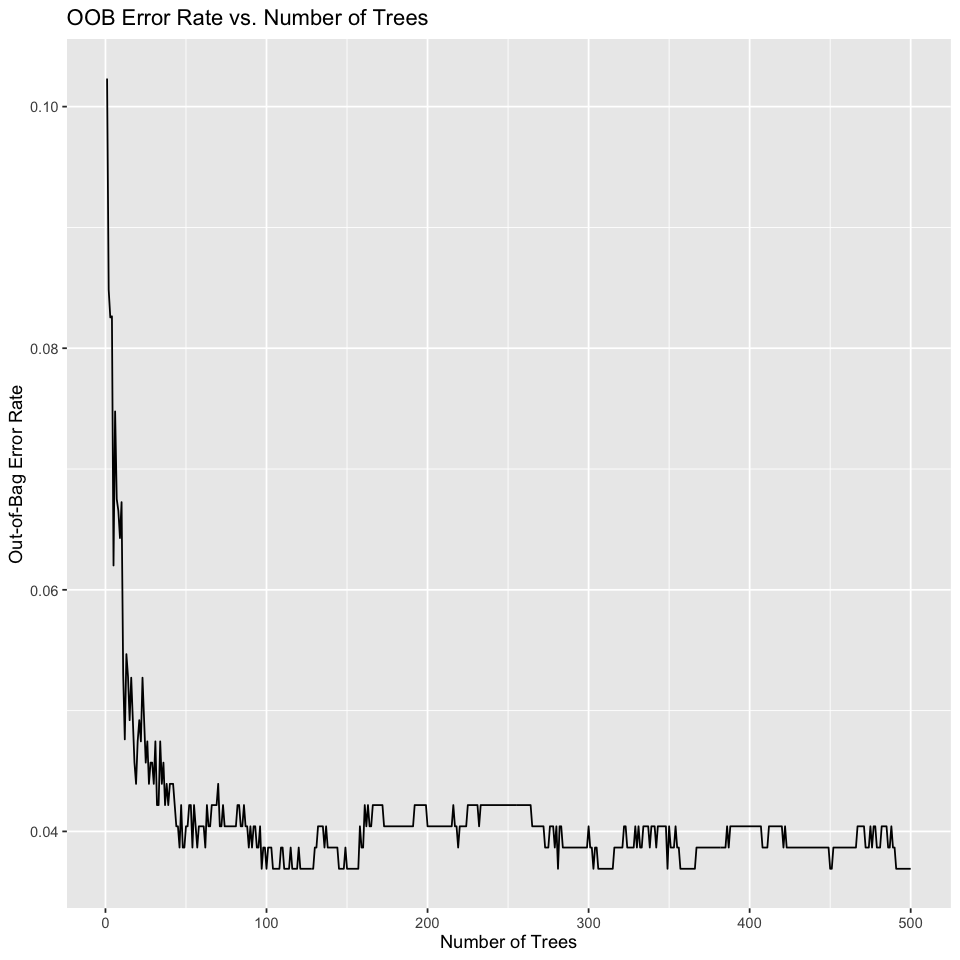

In [81]:
set.seed(42)

breast_cancer$diagnosis <- as.factor(breast_cancer$diagnosis)

rf_model <- randomForest(diagnosis ~., data = breast_cancer, ntree = 500, importance = TRUE)

oob_error_data <- as.data.frame(rf_model$err.rate)
oob_error_data$Trees <- 1:nrow(oob_error_data)

ggplot(data = oob_error_data, aes(x = Trees, y = OOB)) +
    geom_line() +
    labs(title = "OOB Error Rate vs. Number of Trees",
       x = "Number of Trees",
       y = "Out-of-Bag Error Rate")

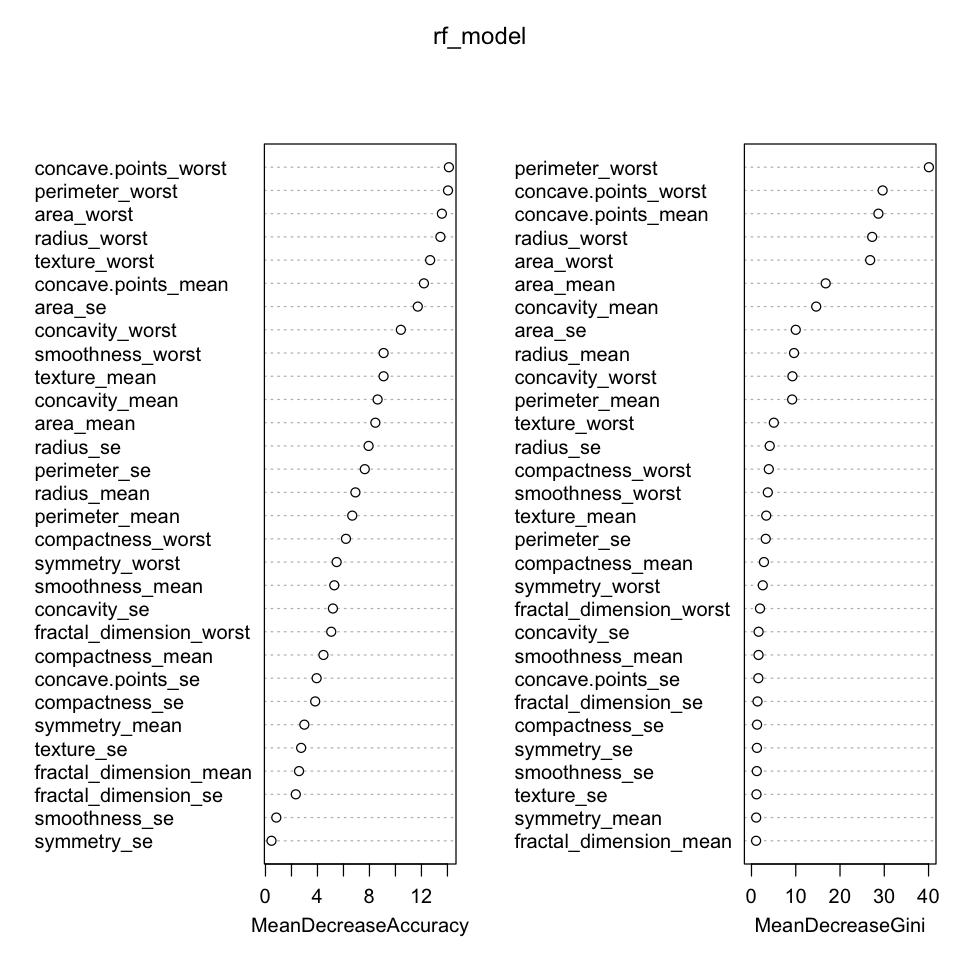

In [82]:
set.seed(42)
rf_model <- randomForest(diagnosis ~., data = breast_cancer, ntree = 309, importance = TRUE)
varImpPlot(rf_model)

**Insights:**

* Both methods identify that the most important predictors of breast cancer diagnosis **are related to `size` and `shape irregularity` of the cell nuclei**.

* Lasso Regression result: It eliminates variables whose predictive information is already captured by others, and dropped `perimeter_worst` and `area_worst`. This doesn't mean these two predictors are bad, and means their information was redundant as `redius_worst` was selected to represent the `size` concept.

* Random Forest result: The right part of the plot (`MeanDecreaseGini`) shows that the most important features are `perimeter_worst`, `concave.points_worst`, `concave.points_mean`, `area_worst`, and `radius_worst`. This confirms that the most powerful predictors are those describing the size and irregularity of the largest or average nuclei.

* Notice that there is a large negative coefficient for `fractal_dimension_se`(-73.66), which means there is an inverse relationship with the outcome. A higher `fractal_dimension_se` indicates more variability in the complexity of the nuclear borders within a tumor. Therefore, the model is saying that the tumours with less variability in their border complexity are more likely to be malignant. However, it only valid after holding all other features in the model constant.